In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#**Load Training Embeddings from .pkl**

In [2]:
import pickle
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Load your CLIP embeddings
with open("/content/drive/MyDrive/DatasetCVPR/clip_train_embeddings.pkl", "rb") as f:
    emb_dict = pickle.load(f)

# Extract filenames and vectors
image_names = list(emb_dict.keys())
embeddings = torch.stack([emb_dict[name] for name in image_names])  # shape: (N, 512)
print(f"Loaded {len(image_names)} embeddings | Shape: {embeddings.shape}")


Loaded 23972 embeddings | Shape: torch.Size([23972, 512])


#**Visualize with t-SNE**

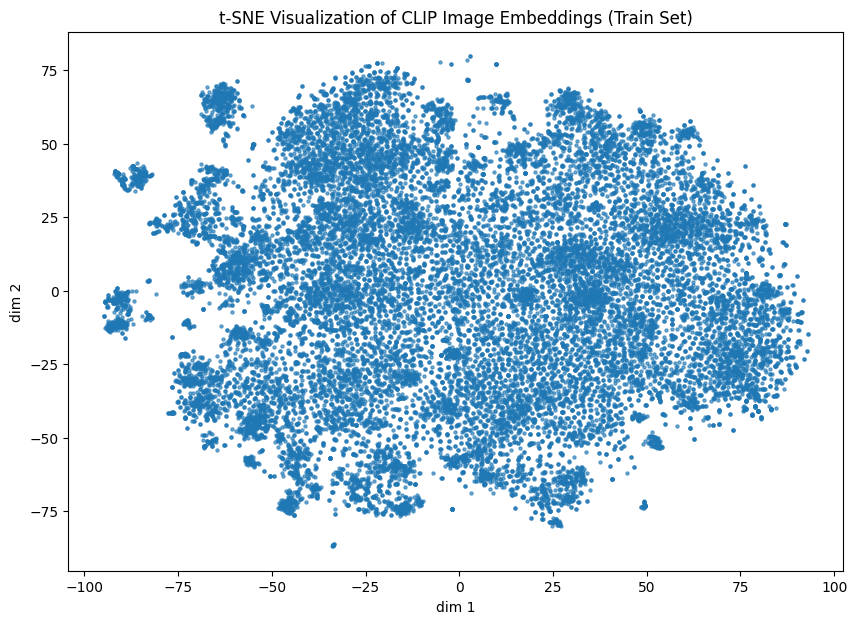

In [3]:
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, perplexity=30, random_state=42)
emb_2d = tsne.fit_transform(embeddings)

plt.figure(figsize=(10, 7))
plt.scatter(emb_2d[:, 0], emb_2d[:, 1], s=5, alpha=0.6)
plt.title("t-SNE Visualization of CLIP Image Embeddings (Train Set)")
plt.xlabel("dim 1"); plt.ylabel("dim 2")
plt.show()


#**KMeans Clustering on Training Embeddings**

In [ ]:
from sklearn.cluster import KMeans

# Convert embeddings to numpy for sklearn
X = embeddings.cpu().numpy()

# Define number of clusters (e.g., 50 is good starting point)
n_clusters = 50
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_ids = kmeans.fit_predict(X)

print("✅ KMeans clustering done.")


✅ KMeans clustering done.


#**Visualize Clusters on t-SNE Map**

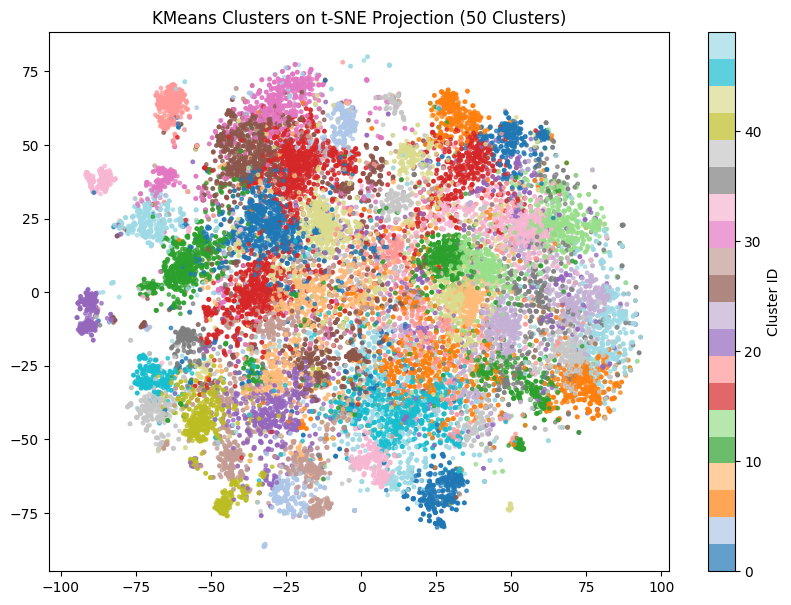

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))
plt.scatter(emb_2d[:, 0], emb_2d[:, 1], c=cluster_ids, cmap='tab20', s=6, alpha=0.7)
plt.title(f"KMeans Clusters on t-SNE Projection ({n_clusters} Clusters)")
plt.colorbar(label="Cluster ID")
plt.show()


#**Finding Optimal number of clusters (k) in KMeans**

✅ Done for k = 10
✅ Done for k = 20
✅ Done for k = 30
✅ Done for k = 40
✅ Done for k = 50
✅ Done for k = 60
✅ Done for k = 70
✅ Done for k = 80
✅ Done for k = 90
✅ Done for k = 100


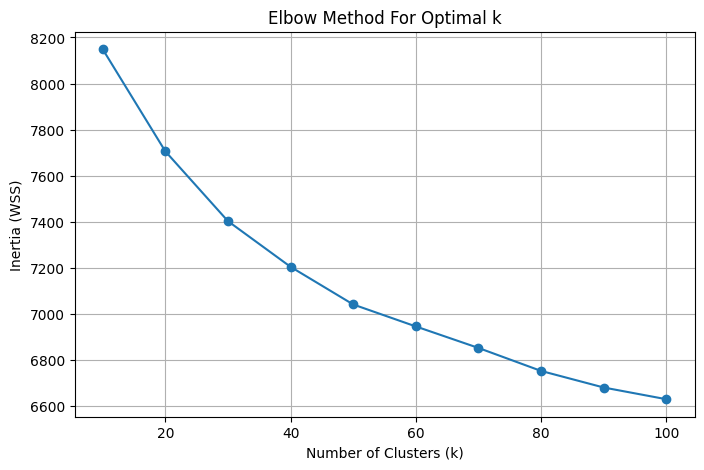

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

inertia = []
k_range = range(10, 101, 10)  # Try values from 10 to 100

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)
    print(f"✅ Done for k = {k}")

# Plot
plt.figure(figsize=(8, 5))
plt.plot(k_range, inertia, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia (WSS)')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()


# This plots the inertia (within-cluster sum of squares) vs k. The "elbow" point indicates the optimal k.


✅ Done for k = 10, silhouette = 0.0095
✅ Done for k = 20, silhouette = 0.0103
✅ Done for k = 30, silhouette = 0.0232
✅ Done for k = 40, silhouette = 0.0196
✅ Done for k = 50, silhouette = 0.0221
✅ Done for k = 60, silhouette = 0.0161
✅ Done for k = 70, silhouette = 0.0155
✅ Done for k = 80, silhouette = 0.0181
✅ Done for k = 90, silhouette = 0.0190
✅ Done for k = 100, silhouette = 0.0182


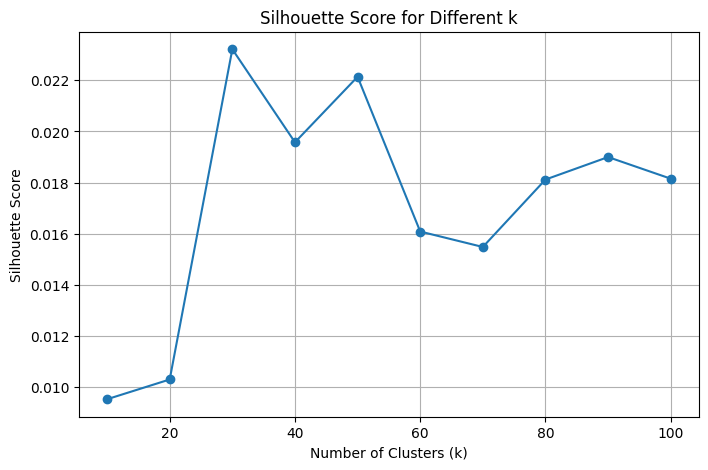

In [ ]:
from sklearn.metrics import silhouette_score

silhouette_scores = []
k_range = range(10, 101, 10)

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    score = silhouette_score(X, cluster_labels)
    silhouette_scores.append(score)
    print(f"✅ Done for k = {k}, silhouette = {score:.4f}")

# Plot
plt.figure(figsize=(8, 5))
plt.plot(k_range, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Different k')
plt.grid(True)
plt.show()


# This measures how similar a point is to its own cluster vs. others


#**Kmeans Clustering Using K=30**

In [4]:
from sklearn.cluster import KMeans

# Convert embeddings to numpy for sklearn
X = embeddings.cpu().numpy()

# Define number of clusters (e.g., 50 is good starting point)
n_clusters = 30
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
cluster_ids = kmeans.fit_predict(X)

print("✅ KMeans clustering done.")


✅ KMeans clustering done.


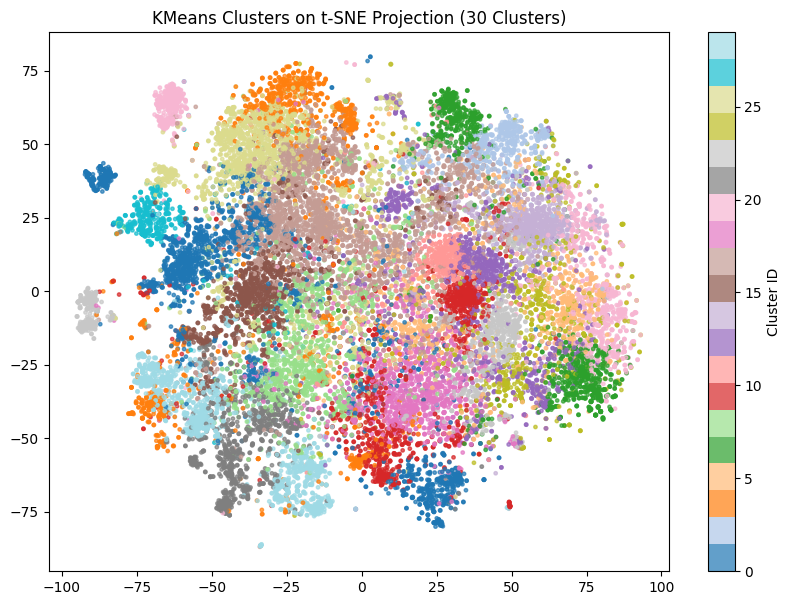

In [5]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 7))
plt.scatter(emb_2d[:, 0], emb_2d[:, 1], c=cluster_ids, cmap='tab20', s=6, alpha=0.7)
plt.title(f"KMeans Clusters on t-SNE Projection ({n_clusters} Clusters)")
plt.colorbar(label="Cluster ID")
plt.show()


In [6]:
import os

# ✅ image_names: list of .jpg filenames (from embedding keys)
# ✅ cluster_ids: array from KMeans.fit_predict()

image_dir = "/content/drive/MyDrive/DatasetCVPR/train"
output_path = "image_cluster_map.txt"

with open(output_path, "w") as f:
    for name, cluster in zip(image_names, cluster_ids):
        full_path = os.path.join(image_dir, name)
        f.write(f"{full_path} --> Cluster {cluster}\n")

print(f"✅ Saved image-cluster map to {output_path}")


✅ Saved image-cluster map to image_cluster_map.txt


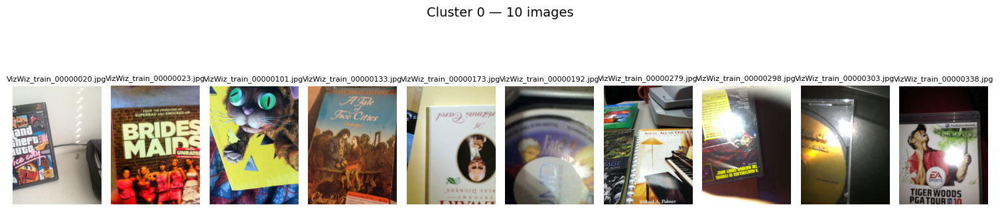

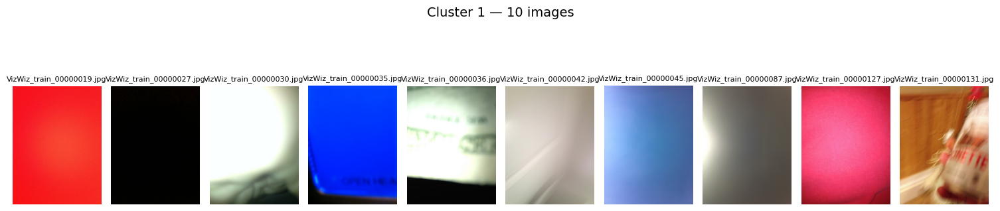

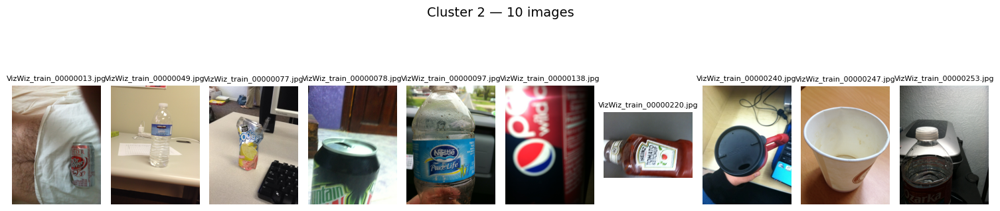

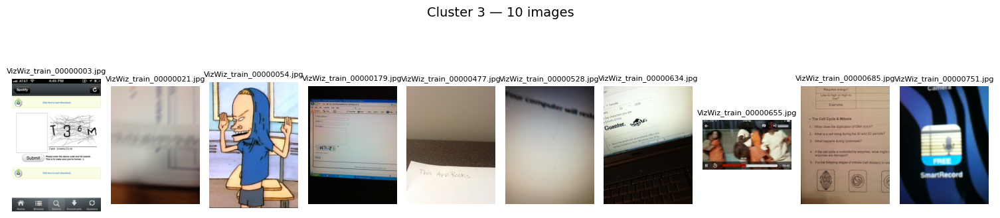

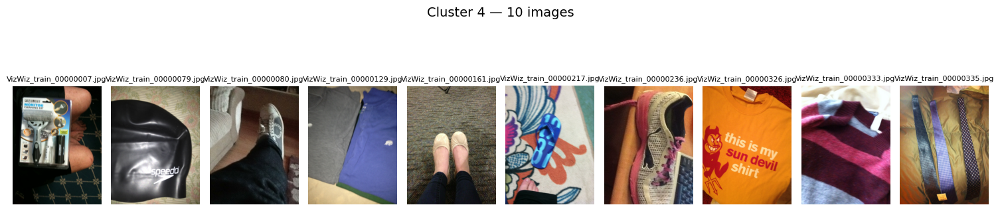

...

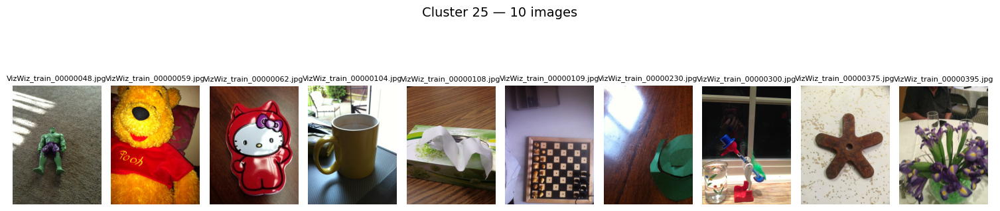

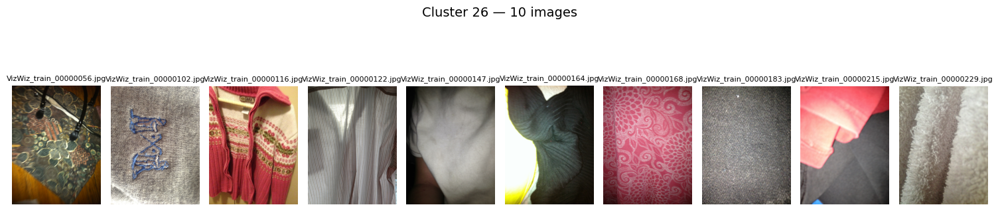

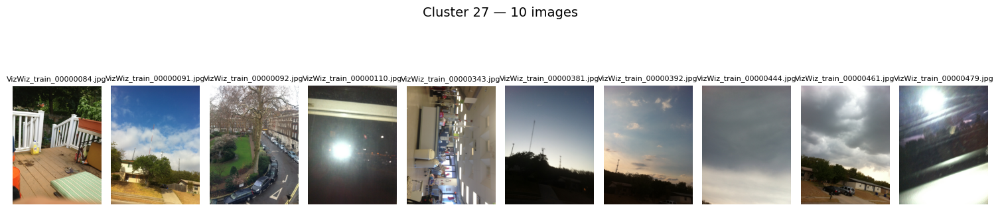

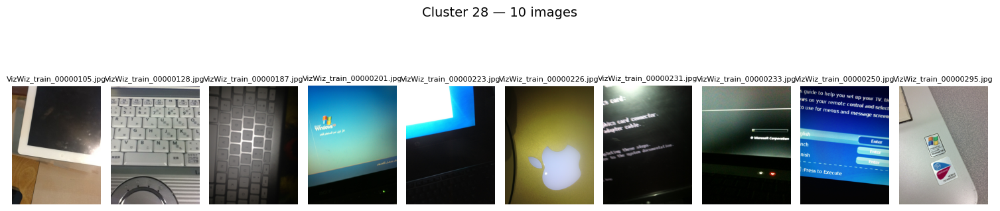

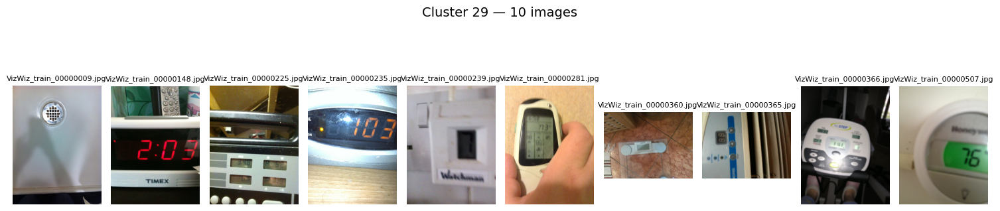

In [9]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# 📄 Load image → cluster map
cluster_map = []
with open("image_cluster_map.txt", "r") as f:
    for line in f:
        path, cluster = line.strip().split(" --> Cluster ")
        cluster_map.append((path, int(cluster)))

# 🔢 Total clusters
num_clusters = max(c for _, c in cluster_map) + 1
images_per_cluster = 10  # Change as needed

# 🔁 Show clusters
for cluster_id in range(num_clusters):
    cluster_images = [path for path, cid in cluster_map if cid == cluster_id][:images_per_cluster]

    if not cluster_images:
        continue

    plt.figure(figsize=(15, 4))
    for i, img_path in enumerate(cluster_images):
        try:
            img = Image.open(img_path).convert("RGB")
            plt.subplot(1, images_per_cluster, i + 1)
            plt.imshow(img)
            plt.axis("off")
            plt.title(os.path.basename(img_path), fontsize=8)
        except Exception as e:
            print(f"⚠️ Error loading {img_path}: {e}")

    plt.suptitle(f"Cluster {cluster_id} — {len(cluster_images)} images", fontsize=14)
    plt.tight_layout()
    plt.show()


#**Cluster → Label Similarity Mapping**

###**Load 200 Labels & Generate Text Embeddings**

In [3]:
!pip uninstall -y clip
!pip install git+https://github.com/openai/CLIP.git


Found existing installation: clip 1.0
Uninstalling clip-1.0:
  Successfully uninstalled clip-1.0
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-vf14aknj
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-vf14aknj
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369489 sha256=5d4906a7cec167a82df6c3d9b650e534b9d246cc9a623cafd1812a601b74b59e
  Stored in directory: /tmp/pip-ephem-wheel-cache-t_fex8e7/wheels/3f/7c/a4/9b490845988bf7a4db33674d52f709f088f64392063872eb9a
Successfully built clip


In [4]:
import json
import urllib.request

# Download ImageNet class index
url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_classes = urllib.request.urlopen(url).read().decode('utf-8').splitlines()

In [5]:
len(imagenet_classes)

1000

In [6]:
labels = imagenet_classes

In [7]:
test_labels = [
    'crock pot', 'desk', 'desktop computer', 'diaper', 'digital clock', 'digital watch', 'dishwasher',
    'doormat', 'electric fan', 'electric guitar', 'envelope', 'espresso maker', 'file', 'fire screen',
    'folding chair', 'fountain', 'frying pan', 'goblet', 'grand piano', 'grocery store', 'hair spray',
    'hamper', 'handkerchief', 'hook', 'ipod', 'iron', 'jean', 'jersey', 'joystick', 'lampshade', 'laptop',
    'library', 'lighter', 'lipstick', 'loafer', 'lotion', 'loudspeaker', 'mailbox', 'measuring cup',
    'microphone', 'microwave', 'mixing bowl', 'modem', 'monitor', 'mouse', 'necklace', 'packet', 'pajama',
    'paper towel', 'patio', 'pedestal', 'perfume', 'picket fence', 'pickup', 'piggy bank', 'pill bottle',
    'pillow', 'pitcher', 'plastic bag', 'pole', 'pop bottle', 'pot', 'printer', 'projector', 'purse', 'quilt',
    'racer', 'radiator', 'radio', 'refrigerator', 'remote control', 'restaurant', 'rocking chair', 'rule',
    'running shoe', 'saltshaker', 'sandal', 'scale', 'screwdriver', 'seat belt', 'shopping cart',
    'shower curtain', 'sliding door', 'lion', 'soap dispenser', 'tiger', 'sock', 'soccer ball', 'ice bear',
    'soup bowl', 'space heater', 'sports car', 'stage', 'fly', 'bee', 'stove', 'strainer', 'studio couch',
    'suit', 'sunglasses', 'sunscreen', 'sweatshirt', 'swing', 'table lamp', 'tape player', 'teapot', 'teddy',
    'television', 'hog', 'tile roof', 'toaster', 'toilet seat', 'trailer truck', 'tray', 'tub', 'umbrella',
    'upright', 'vacuum', 'vase', 'vending machine', 'wall clock', 'wallet', 'wardrobe', 'washbasin', 'washer',
    'water bottle', 'water jug', 'window screen', 'window shade', 'windsor tie', 'wine bottle', 'wok',
    'wooden spoon', 'acoustic guitar', 'comic book', 'street sign', 'analog clock', 'menu', 'plate', 'ashcan',
    'book jacket', 'backpack', 'ice cream', 'ballpoint', 'pretzel', 'cheeseburger', 'hotdog', 'mashed potato',
    'broccoli', 'cauliflower', 'barrel', 'baseball', 'basketball', 'cucumber', 'artichoke', 'bell pepper',
    'bath towel', 'mushroom', 'granny smith', 'strawberry', 'orange', 'lemon', 'beer bottle', 'pineapple',
    'banana', 'bathtub', 'pomegranate', 'binder', 'dough', 'pizza', 'bookcase', 'red wine', 'espresso', 'cup',
    'bow tie', 'bucket', 'buckle', 'valley', 'ballplayer', 'candle', 'can opener', 'cardigan', 'car mirror',
    'corn', 'carton', 'car wheel', 'cassette', 'cassette player', 'cd player', 'cellular telephone',
    'toilet tissue', 'chain', 'chainlink fence', 'chest', 'chiffonier', 'chime', 'china cabinet',
    'christmas stocking', 'coffee mug', 'computer keyboard'
]


In [8]:
print(f"Total Labels : {len(labels)}")

Total Labels : 1000


In [9]:
import torch
import clip  # Make sure 'clip' is installed via openai/CLIP or 'clip-by-openai'

# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"

# Generate text prompts
prompts = [f"a photo of a {label}" for label in labels]

# Load CLIP model (ViT-B/32)
model, _ = clip.load("ViT-B/32", device=device)

# Encode text with CLIP
with torch.no_grad():
    text_tokens = clip.tokenize(prompts).to(device)  # (N, 77)
    text_features = model.encode_text(text_tokens)   # (N, 512)
    text_features = text_features / text_features.norm(dim=-1, keepdim=True)  # Normalize


###**Compute Cluster Centroids**

In [10]:
from collections import defaultdict
import numpy as np

# embeddings: torch.Tensor of shape (N, 512)
# cluster_ids: np.array of cluster indices

cluster_embeddings = defaultdict(list)
for idx, cluster_id in enumerate(cluster_ids):
    cluster_embeddings[cluster_id].append(embeddings[idx])

# compute centroids
cluster_centroids = {}
for cluster_id, emb_list in cluster_embeddings.items():
    cluster_tensor = torch.stack(emb_list)
    centroid = cluster_tensor.mean(dim=0)
    centroid = centroid / centroid.norm()  # normalize
    cluster_centroids[cluster_id] = centroid


#**Visualizing the 30 Cluster Centroids**

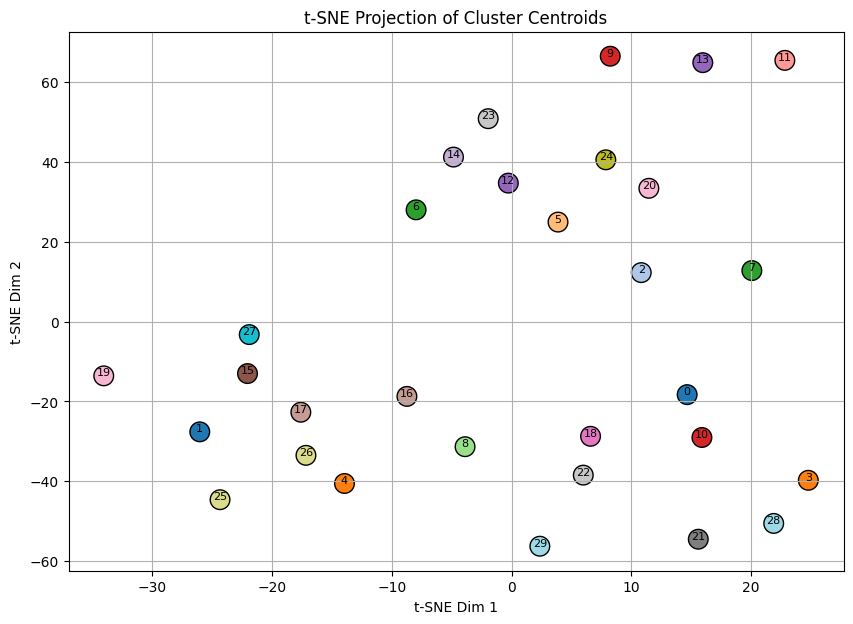

In [13]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Convert centroids to a single tensor or numpy array
centroid_ids = sorted(cluster_centroids.keys())
centroids = torch.stack([cluster_centroids[cid] for cid in centroid_ids]).cpu().numpy()  # shape: (n_clusters, 512)

# Reduce to 2D using t-SNE (or use PCA if you prefer faster but less detailed)
tsne = TSNE(n_components=2, perplexity=5, random_state=42)
centroids_2d = tsne.fit_transform(centroids)  # shape: (n_clusters, 2)

# Plot centroids
plt.figure(figsize=(10, 7))
plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1], c=centroid_ids, cmap='tab20', s=200, edgecolors='black')
for i, cid in enumerate(centroid_ids):
    plt.text(centroids_2d[i, 0], centroids_2d[i, 1], str(cid), fontsize=8, ha='center')
plt.title("t-SNE Projection of Cluster Centroids")
plt.xlabel("t-SNE Dim 1")
plt.ylabel("t-SNE Dim 2")
plt.grid(True)
plt.show()


###**Match Each Cluster to Top-5 Labels**

In [11]:
print(f"# of labels: {len(labels)}")
print(f"text_features shape: {text_features.shape}")


# of labels: 1000
text_features shape: torch.Size([1000, 512])


In [ ]:
# cluster_to_labels = {}

# for cluster_id, centroid in cluster_centroids.items():
#     centroid = centroid.to(text_features.device)  # move to GPU if needed
#     sims = centroid @ text_features.T             # cosine similarity
#     top_vals, top_idxs = sims.topk(5)
#     top_label_names = [labels[i] for i in top_idxs.cpu().numpy()]
#     cluster_to_labels[cluster_id] = top_label_names
#     print(f"Cluster {cluster_id}: {top_label_names}")


In [12]:
# Ensure both tensors are on the same device and have the same dtype
text_features = text_features.to(torch.float32)

cluster_to_labels = {}

for cluster_id, centroid in cluster_centroids.items():
    # Move centroid to the same device and dtype as text_features
    centroid = centroid.to(device=text_features.device, dtype=torch.float32)

    # Compute cosine similarity via dot product (assuming vectors are normalized)
    sims = centroid @ text_features.T

    # Get top 5 most similar text features
    top_vals, top_idxs = sims.topk(5)

    # Map indices to label names
    top_label_names = [labels[i] for i in top_idxs.cpu().numpy()]

    # Store result
    cluster_to_labels[cluster_id] = top_label_names

    # Print top labels for each cluster
    print(f"Cluster {cluster_id}: {top_label_names}")


Cluster 24: ['carton', 'packet', 'confectionery', 'ashcan', 'hamper']
Cluster 15: ['entertainment center', 'table lamp', 'dining table', 'television', 'crutch']
Cluster 14: ['can opener', 'carton', 'milk can', 'pill bottle', 'consomme']
Cluster 3: ['web site', 'file', 'screen', 'envelope', 'rule']
Cluster 18: ['packet', 'envelope', 'carton', 'ashcan', 'book jacket']
Cluster 17: ['hip', 'clumber', 'overskirt', 'sock', 'patas']
Cluster 13: ['lotion', 'carton', 'sunscreen', 'pop bottle', 'packet']
Cluster 4: ['maillot', 'maillot', 'academic gown', 'jersey', 'vestment']
Cluster 12: ['packet', 'confectionery', 'carton', 'bib', 'tray']
Cluster 29: ['digital clock', 'dial telephone', 'microwave', 'scale', 'analog clock']
Cluster 21: ['remote control', 'hand-held computer', 'modem', 'cellular telephone', 'monitor']
Cluster 2: ['pop bottle', 'water bottle', 'cocktail shaker', 'ashcan', 'carton']
Cluster 23: ['carton', 'packet', 'pop bottle', 'measuring cup', 'lotion']
Cluster 22: ['wallet', 'as

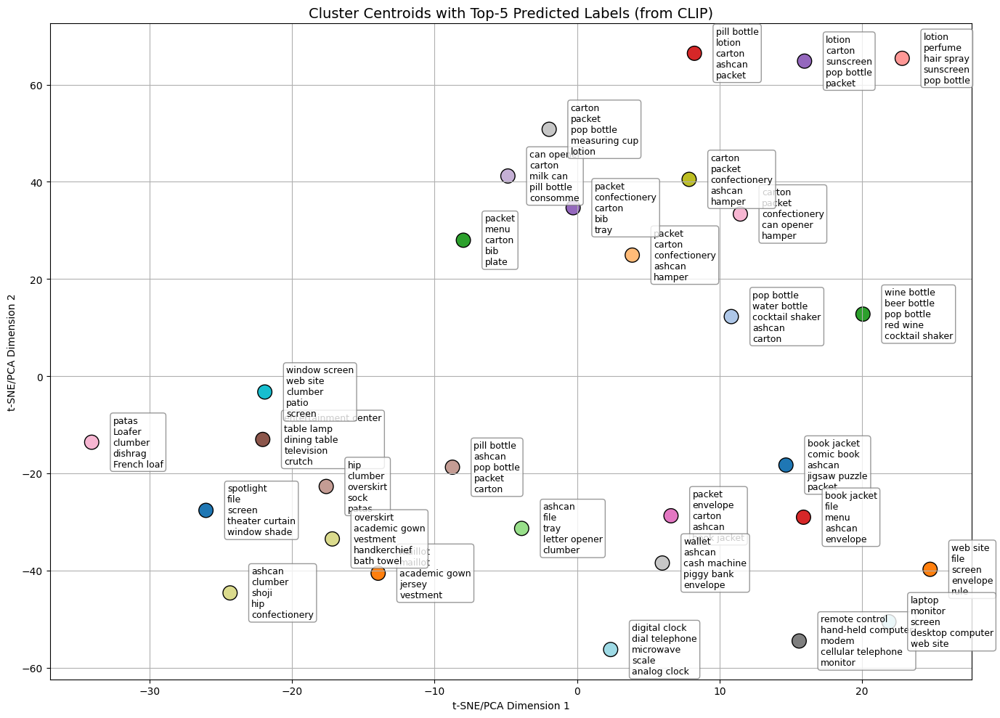

In [16]:
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 10))

# Plot centroids
plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1],
            c=centroid_ids, cmap='tab20',
            s=200, edgecolors='black', label='Centroids')

# Annotate with top labels
for i, cid in enumerate(centroid_ids):
    x, y = centroids_2d[i]
    labels_str = "\n".join(cluster_to_labels[cid])  # top-5 labels as multiline
    plt.text(x + 1.5, y, labels_str, fontsize=9, va='center', ha='left',
             bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.8))

plt.title("Cluster Centroids with Top-5 Predicted Labels (from CLIP)", fontsize=14)
plt.xlabel("t-SNE/PCA Dimension 1")
plt.ylabel("t-SNE/PCA Dimension 2")
plt.grid(True)
plt.tight_layout()
plt.show()


##**Save cluster_centroids and cluster_to_labels for test use**

In [13]:
import pickle

with open("cluster_centroids.pkl", "wb") as f:
    pickle.dump(cluster_centroids, f)

with open("cluster_to_labels.pkl", "wb") as f:
    pickle.dump(cluster_to_labels, f)

print("✅ Cluster data saved.")


✅ Cluster data saved.


#**Extract CLIP Embeddings for Test Images**

In [ ]:
# import os
# from PIL import Image
# import torch
# import clip
# from tqdm import tqdm
# import pickle

# # Setup
# device = "cuda" if torch.cuda.is_available() else "cpu"
# model, preprocess = clip.load("ViT-B/32", device=device)
# model.eval()

# # Test image directory
# test_dir = "/content/drive/MyDrive/DatasetCVPR/test"
# output_path = "clip_test_embeddings.pkl"

# # Get list of test image paths
# test_image_paths = sorted([
#     os.path.join(test_dir, f)
#     for f in os.listdir(test_dir)
#     if f.lower().endswith(('.jpg', '.png', '.jpeg'))
# ])

# print(f"Found {len(test_image_paths)} test images.")

# # Extract embeddings
# test_embeddings = {}

# with torch.no_grad():
#     for path in tqdm(test_image_paths, desc="Extracting test embeddings"):
#         try:
#             image = preprocess(Image.open(path).convert("RGB")).unsqueeze(0).to(device)
#             embedding = model.encode_image(image)
#             embedding = embedding / embedding.norm(dim=-1, keepdim=True)
#             test_embeddings[os.path.basename(path)] = embedding.cpu().squeeze(0)
#         except Exception as e:
#             print(f"Error processing {path}: {e}")

# # Save to pickle
# with open(output_path, "wb") as f:
#     pickle.dump(test_embeddings, f)

# print(f"✅ Saved {len(test_embeddings)} test embeddings to {output_path}")


In [14]:
import torch
import clip
from PIL import Image
import pickle

# ====== Setup ======
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

# ====== Load cluster data ======
with open("cluster_centroids.pkl", "rb") as f:
    cluster_centroids = pickle.load(f)
with open("cluster_to_labels.pkl", "rb") as f:
    cluster_to_labels = pickle.load(f)


In [ ]:
cluster_centroids

{np.int32(24): tensor([-2.2888e-02, -2.4681e-03, -1.5900e-02,  4.9377e-02,  2.9648e-02,
          2.8717e-02,  2.3621e-02, -3.3081e-02, -3.3875e-02,  1.5274e-02,
          1.4557e-02,  1.5442e-02,  2.3453e-02, -8.2245e-03,  1.9348e-02,
         -1.2383e-02,  1.3672e-01,  1.3016e-02,  3.8605e-03, -1.8707e-02,
         -1.9055e-01, -2.0889e-02, -3.9886e-02, -3.6743e-02, -3.2593e-02,
          3.6957e-02, -2.1744e-02,  1.1803e-02,  5.2032e-03,  2.2217e-02,
          2.8839e-03,  5.5725e-02, -1.3275e-02,  1.7990e-02,  6.7261e-02,
          1.0994e-02, -2.7008e-02, -3.7567e-02, -3.0880e-03,  3.9429e-02,
         -1.0742e-02, -1.3710e-02,  2.4643e-02, -8.9874e-03, -1.4601e-03,
         -6.5063e-02,  3.1464e-02,  2.7100e-02, -1.1116e-02, -8.7128e-03,
          4.2572e-02, -1.3397e-02,  5.6496e-03,  7.5722e-03, -1.2703e-02,
         -2.8244e-02, -1.2978e-02,  1.4992e-02,  2.5681e-02,  6.8779e-03,
         -7.0618e-02,  3.1586e-02,  1.1154e-02,  1.1971e-02, -2.8397e-02,
         -1.4633e-02, -1

In [ ]:
cluster_to_labels

{np.int32(24): ['carton', 'packet', 'ashcan', 'hamper', 'lotion'],
 np.int32(15): ['table lamp',
  'television',
  'wardrobe',
  'electric fan',
  'ashcan'],
 np.int32(14): ['can opener', 'carton', 'pill bottle', 'ashcan', 'packet'],
 np.int32(3): ['file', 'envelope', 'rule', 'packet', 'digital clock'],
 np.int32(18): ['packet', 'envelope', 'carton', 'ashcan', 'book jacket'],
 np.int32(17): ['sock', 'jersey', 'pillow', 'diaper', 'handkerchief'],
 np.int32(13): ['lotion', 'carton', 'sunscreen', 'pop bottle', 'packet'],
 np.int32(4): ['jersey', 'sweatshirt', 'ashcan', 'pajama', 'suit'],
 np.int32(12): ['packet', 'carton', 'tray', 'hamper', 'menu'],
 np.int32(29): ['digital clock',
  'microwave',
  'scale',
  'analog clock',
  'digital watch'],
 np.int32(21): ['remote control',
  'modem',
  'cellular telephone',
  'digital watch',
  'monitor'],
 np.int32(2): ['pop bottle', 'water bottle', 'ashcan', 'carton', 'packet'],
 np.int32(23): ['carton', 'packet', 'pop bottle', 'measuring cup', 'lo

In [15]:
# ====== Load and preprocess test image ======
test_img_path = "/content/drive/MyDrive/DatasetCVPR/test/VizWiz_test_00007756.jpg"
image = preprocess(Image.open(test_img_path).convert("RGB")).unsqueeze(0).to(device)

with torch.no_grad():
    img_feat = model.encode_image(image)
    img_feat = img_feat / img_feat.norm(dim=-1, keepdim=True)


# ====== Find closest cluster ======
best_cluster = None
highest_sim = -1

for cluster_id, centroid in cluster_centroids.items():
    # Ensure centroid is on the same device AND has the same data type as img_feat
    centroid = centroid.to(device=device, dtype=img_feat.dtype)
    sim = torch.dot(img_feat.squeeze(0), centroid)
    if sim > highest_sim:
        highest_sim = sim
        best_cluster = cluster_id

print(f"✅ Closest Cluster: {best_cluster}")


# ====== Use only that cluster’s labels for prediction ======
cluster_labels = cluster_to_labels[best_cluster]  # ✅ Only top-k labels from that cluster
prompts = [f"a photo of a {label}" for label in cluster_labels]

with torch.no_grad():
    text_tokens = clip.tokenize(prompts).to(device)
    cluster_text_features = model.encode_text(text_tokens)
    cluster_text_features /= cluster_text_features.norm(dim=-1, keepdim=True)

# ====== Cosine similarity + prediction (restricted) ======
sims = img_feat @ cluster_text_features.T  # shape: (1, M)
top_vals, top_idxs = sims.topk(min(5, len(cluster_labels)))

top_labels = [cluster_labels[i] for i in top_idxs.squeeze(0).cpu().numpy()]
top_scores = top_vals.squeeze(0).cpu().numpy()

print("\n🔮 Top-5 Predictions with Similarity Scores:")
for i, (label, score) in enumerate(zip(top_labels, top_scores)):
    print(f"{i+1}. {label} ----(cosine similarity: {score:.4f})")


✅ Closest Cluster: 29

🔮 Top-5 Predictions with Similarity Scores:
1. microwave ----(cosine similarity: 0.2637)
2. digital clock ----(cosine similarity: 0.2581)
3. dial telephone ----(cosine similarity: 0.2452)
4. analog clock ----(cosine similarity: 0.2380)
5. scale ----(cosine similarity: 0.2241)


In [16]:
# ==== Evaluation against 200 known labels ====
test_label_set = set(test_labels)  # your 200 known labels list

# Check if any of the top-5 predicted labels match
match_found = any(label in test_label_set for label in top_labels)

if match_found:
    print("✅ SUCCESS: At least one of the top-5 predictions matched your known 200 labels.")
else:
    print("❌ FAIL: No prediction matched the 200 known labels.")


✅ SUCCESS: At least one of the top-5 predictions matched your known 200 labels.


#**Visualize Test Image with Cluster Centroids & Labels**

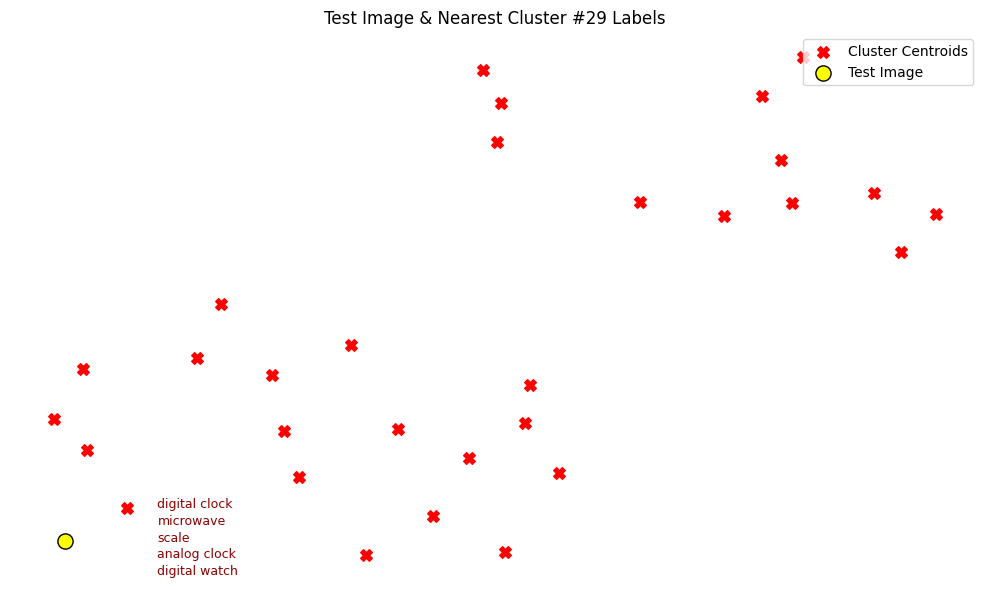

In [ ]:
import torch
import clip
from PIL import Image
import pickle
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE

# ====== Setup ======
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

# ====== Load cluster data ======
with open("cluster_centroids.pkl", "rb") as f:
    cluster_centroids = pickle.load(f)
with open("cluster_to_labels.pkl", "rb") as f:
    cluster_to_labels = pickle.load(f)

# ====== Load and embed the test image ======
test_img_path = "/content/drive/MyDrive/DatasetCVPR/test/VizWiz_test_00007756.jpg"
image = preprocess(Image.open(test_img_path).convert("RGB")).unsqueeze(0).to(device)

with torch.no_grad():
    img_feat = model.encode_image(image)
    img_feat = img_feat / img_feat.norm(dim=-1, keepdim=True)

# ====== Get all cluster centroids as tensor ======
centroid_ids = list(cluster_centroids.keys())
centroid_tensors = torch.stack([cluster_centroids[cid] for cid in centroid_ids])

# ====== Combine image + centroids and project to 2D ======
combined = torch.cat([img_feat.cpu(), centroid_tensors.cpu()], dim=0)  # shape: (K+1, 512)
tsne = TSNE(n_components=2, perplexity=5, random_state=42)
proj_2d = tsne.fit_transform(combined.numpy())

# Split
test_2d = proj_2d[0]
centroids_2d = proj_2d[1:]

# ====== Find nearest cluster ======
max_sim = -1
best_cluster = None
for cid, center in cluster_centroids.items():
    # Ensure centroid is on the same device AND has the same data type as img_feat
    # Convert center to the same dtype as img_feat
    center = center.type(img_feat.dtype).to(device)
    sim = torch.dot(img_feat.squeeze(0), center)
    if sim > max_sim:
        max_sim = sim
        best_cluster = cid

top_labels = cluster_to_labels[best_cluster]
cx, cy = centroids_2d[centroid_ids.index(best_cluster)]

# ====== Plot ======
plt.figure(figsize=(10, 6))

# Plot all centroids
plt.scatter(centroids_2d[:, 0], centroids_2d[:, 1], c='red', s=70, marker='X', label="Cluster Centroids")

# Highlight test image
plt.scatter(test_2d[0], test_2d[1], c='yellow', edgecolor='black', s=120, label="Test Image")

# Annotate predicted labels at its cluster
for i, label in enumerate(top_labels):
    plt.text(cx + 2, cy - i*2, label, fontsize=9, color='darkred')

plt.title(f"Test Image & Nearest Cluster #{best_cluster} Labels")
plt.legend()
plt.axis("off")
plt.tight_layout()
plt.show()


#####*To make our Predictions more accurate we are going to apply Prompt Ensembling, where we create multiple prompt templates for each label, generate text embeddings for all of them, take their mean embedding, and use that for prediction.*

#**Prompt Ensembling Implementation**

In [ ]:
import torch
import clip

# === Load CLIP Model ===
device = "cuda" if torch.cuda.is_available() else "cpu"
model, _ = clip.load("ViT-B/32", device=device)
model.eval()


prompt_templates = [
    "a photo of a {}",
    "a blurry photo of a {}",
    "an object that looks like a {}",
    "a low-quality image of a {}",
    "a close-up shot of a {}",
    "a dimly lit photo of a {}",
    "a cropped photo of a {}",
    "a partially visible {} in a frame",
    "an indoor shot showing a {}",
    "an object resembling a {}",
    "a low-resolution photo of a {}",
    "a side-angle view of a {}",
    "a cluttered background photo featuring a {}",
    "a reflection or mirrored image of a {}",
    "a partial view showing a {}",
    "an object captured under artificial lighting: a {}",
    "a zoomed-in shot highlighting a {}",
    "a casually placed {} in a home setting",
    "an image showing a {} among other household items",
    "a casual photo where a {} is not clearly centered"
]




# === Build prompt ensemble embeddings ===
all_text_features = []
with torch.no_grad():
    for label in labels:
        prompt_variants = [template.format(label) for template in prompt_templates]
        tokenized = clip.tokenize(prompt_variants).to(device)

        # Batch in chunks if tokenized.shape[0] > 16 (GPU safe)
        embeddings = model.encode_text(tokenized)
        embeddings = embeddings / embeddings.norm(dim=-1, keepdim=True)

        avg_embedding = embeddings.mean(dim=0)
        avg_embedding = avg_embedding / avg_embedding.norm()
        all_text_features.append(avg_embedding)

text_features_ensemble = torch.stack(all_text_features)


print("✅ Text embeddings generated with prompt ensembling:", text_features_ensemble.shape)


✅ Text embeddings generated with prompt ensembling: torch.Size([200, 512])


In [ ]:
# Save to PyTorch's native format
torch.save(text_features_ensemble, "ensemble_text_embeddings.pt")
print("📁 Saved to: ensemble_text_embeddings.pt (shape: {})".format(text_features_ensemble.shape))


📁 Saved to: ensemble_text_embeddings.pt (shape: torch.Size([200, 512]))


In [ ]:
# import torch
# import clip
# from PIL import Image
# import pickle

# # ==== Setup ====
# device = "cuda" if torch.cuda.is_available() else "cpu"
# model, preprocess = clip.load("ViT-B/32", device=device)
# model.eval()

# # ==== Load Saved Prompt-Ensembled Embeddings ====
# text_features_ensemble = torch.load("ensemble_text_embeddings.pt").to(device)


# # ==== Load Cluster Info ====
# with open("cluster_centroids.pkl", "rb") as f:
#     cluster_centroids = pickle.load(f)

# with open("cluster_to_labels.pkl", "rb") as f:
#     cluster_to_labels = pickle.load(f)

# # ==== Load and Preprocess a Single Test Image ====
# test_img_path = "/content/drive/MyDrive/DatasetCVPR/test/VizWiz_test_00007973.jpg"  # 🔁 CHANGE if needed
# image = preprocess(Image.open(test_img_path).convert("RGB")).unsqueeze(0).to(device)

# with torch.no_grad():
#     img_feat = model.encode_image(image)
#     img_feat = img_feat / img_feat.norm(dim=-1, keepdim=True)

# # ==== Find Nearest Cluster ====
# best_cluster = None
# highest_sim = -1
# for cid, centroid in cluster_centroids.items():
#     sim = torch.dot(img_feat.squeeze(0), centroid.to(device))
#     if sim > highest_sim:
#         highest_sim = sim
#         best_cluster = cid

# print(f"✅ Nearest Cluster ID: {best_cluster}")

# # ==== Get Cluster-Specific Labels & Embeddings ====
# cluster_labels = cluster_to_labels[best_cluster]
# selected_idxs = [labels.index(lbl) for lbl in cluster_labels]
# selected_text_features = text_features_ensemble[selected_idxs]

# # ==== Compute Cosine Similarity & Predict Top-5 Labels ====
# sims = img_feat @ selected_text_features.T
# top_vals, top_idxs = sims.topk(min(5, len(cluster_labels)))

# top_labels = [cluster_labels[i] for i in top_idxs.squeeze(0).cpu().numpy()]
# top_scores = top_vals.squeeze(0).cpu().numpy()

# print("\n🔮 Top-5 Predictions (Cluster-Restricted + Prompt Ensemble):")
# for i, (label, score) in enumerate(zip(top_labels, top_scores)):
#     print(f"{i+1}. {label}  ----  (cosine similarity: {score:.4f})")


In [ ]:
import torch
import clip
from PIL import Image
import pickle

# ==== Setup ====
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

# ==== Load Saved Prompt-Ensembled Embeddings ====
text_features_ensemble = torch.load("ensemble_text_embeddings.pt").to(device)


# ==== Load Cluster Info ====
with open("cluster_centroids.pkl", "rb") as f:
    cluster_centroids = pickle.load(f)

with open("cluster_to_labels.pkl", "rb") as f:
    cluster_to_labels = pickle.load(f)

# ==== Load and Preprocess a Single Test Image ====
test_img_path = "/content/drive/MyDrive/DatasetCVPR/test/VizWiz_test_00007756.jpg"  # 🔁 CHANGE if needed
image = preprocess(Image.open(test_img_path).convert("RGB")).unsqueeze(0).to(device)

with torch.no_grad():
    img_feat = model.encode_image(image)
    img_feat = img_feat / img_feat.norm(dim=-1, keepdim=True)

# ==== Find Nearest Cluster ====
best_cluster = None
highest_sim = -1
for cid, centroid in cluster_centroids.items():
    # Ensure both tensors are on the same device AND have the same data type
    # Convert centroid to the same device and dtype as img_feat
    centroid_on_device = centroid.to(device=device, dtype=img_feat.dtype)
    sim = torch.dot(img_feat.squeeze(0), centroid_on_device)
    if sim > highest_sim:
        highest_sim = sim
        best_cluster = cid

print(f"✅ Nearest Cluster ID: {best_cluster}")

# ==== Get Cluster-Specific Labels & Embeddings ====
cluster_labels = cluster_to_labels[best_cluster]
selected_idxs = [labels.index(lbl) for lbl in cluster_labels]
selected_text_features = text_features_ensemble[selected_idxs]

# ==== Compute Cosine Similarity & Predict Top-5 Labels ====
sims = img_feat @ selected_text_features.T
top_vals, top_idxs = sims.topk(min(5, len(cluster_labels)))

top_labels = [cluster_labels[i] for i in top_idxs.squeeze(0).cpu().numpy()]
top_scores = top_vals.squeeze(0).cpu().numpy()

print("\n🔮 Top-5 Predictions (Cluster-Restricted + Prompt Ensemble):")
for i, (label, score) in enumerate(zip(top_labels, top_scores)):
    print(f"{i+1}. {label}  ----  (cosine similarity: {score:.4f})")

✅ Nearest Cluster ID: 29

🔮 Top-5 Predictions (Cluster-Restricted + Prompt Ensemble):
1. microwave  ----  (cosine similarity: 0.2822)
2. digital clock  ----  (cosine similarity: 0.2707)
3. analog clock  ----  (cosine similarity: 0.2598)
4. scale  ----  (cosine similarity: 0.2423)
5. digital watch  ----  (cosine similarity: 0.2411)


In [ ]:
# import torch
# import clip
# from PIL import Image
# import pickle

# # ==== Setup ====
# device = "cuda" if torch.cuda.is_available() else "cpu"
# model, preprocess = clip.load("ViT-B/32", device=device)
# model.eval()

# # ==== Load prompt-ensembled embeddings ====
# text_features_ensemble = torch.load("ensemble_text_embeddings.pt").to(device)

# # ==== Labels list (must match original order) ====
# labels = [  # same label list used during ensemble
#     "wallet", "hotdog", "microwave", "toaster", "laptop",
#     # ... all 200 labels ...
# ]

# # ==== Load cluster data ====
# with open("cluster_centroids.pkl", "rb") as f:
#     cluster_centroids = pickle.load(f)
# with open("cluster_to_labels.pkl", "rb") as f:
#     cluster_to_labels = pickle.load(f)

# # ==== Load and preprocess single test image ====
# test_img_path = "/content/drive/MyDrive/DatasetCVPR/test/VizWiz_test_00007936.jpg"
# image = preprocess(Image.open(test_img_path).convert("RGB")).unsqueeze(0).to(device)

# with torch.no_grad():
#     img_feat = model.encode_image(image)
#     img_feat = img_feat / img_feat.norm(dim=-1, keepdim=True)

# # ==== Find closest cluster =====
# best_cluster = None
# highest_sim = -1
# for cid, center in cluster_centroids.items():
#     sim = torch.dot(img_feat.squeeze(0), center.to(device))
#     if sim > highest_sim:
#         highest_sim = sim
#         best_cluster = cid

# print(f"✅ Closest Cluster: {best_cluster}")

# # ==== Get cluster-specific label indices and text embeddings =====
# cluster_labels = cluster_to_labels[best_cluster]
# selected_idxs = [labels.index(lbl) for lbl in cluster_labels]
# selected_text_features = text_features_ensemble[selected_idxs]

# # ==== Similarity & Top-5 Prediction =====
# sims = img_feat @ selected_text_features.T  # shape: (1, N_cluster_labels)
# top_vals, top_idxs = sims.topk(min(5, len(cluster_labels)))

# top_labels = [cluster_labels[i] for i in top_idxs.squeeze(0).cpu().numpy()]
# top_scores = top_vals.squeeze(0).cpu().numpy()

# print("\n🔮 Top-5 Predictions with Cosine Similarity:")
# for i, (label, score) in enumerate(zip(top_labels, top_scores)):
#     print(f"{i+1}. {label} ----(cosine similarity: {score:.4f})")


#**Prompt Ensembling Only (No Cluster Restriction)**

In [ ]:
# import torch
# import clip
# from PIL import Image

# # ==== Setup ====
# device = "cuda" if torch.cuda.is_available() else "cpu"
# model, preprocess = clip.load("ViT-B/32", device=device)
# model.eval()

# # ==== Load prompt-ensembled text features ====
# text_features_ensemble = torch.load("ensemble_text_embeddings.pt").to(device)


# # ==== Load and preprocess test image ====
# test_img_path = "/content/drive/MyDrive/DatasetCVPR/test/VizWiz_test_00007756.jpg"  # 🔁 change path
# image = preprocess(Image.open(test_img_path).convert("RGB")).unsqueeze(0).to(device)

# with torch.no_grad():
#     img_feat = model.encode_image(image)
#     img_feat = img_feat / img_feat.norm(dim=-1, keepdim=True)

# # ==== Predict from full 200 labels (no cluster restriction) ====
# sims = img_feat @ text_features_ensemble.T  # shape: (1, 200)
# top_vals, top_idxs = sims.topk(5)

# top_labels = [labels[i] for i in top_idxs.squeeze(0).cpu().numpy()]
# top_scores = top_vals.squeeze(0).cpu().numpy()

# print("\n🔮 Top-5 Predictions (Prompt Ensembling Only):")
# for i, (label, score) in enumerate(zip(top_labels, top_scores)):
#     print(f"{i+1}. {label}  ----  (cosine similarity: {score:.4f})")



🔮 Top-5 Predictions (Prompt Ensembling Only):
1. dishwasher  ----  (cosine similarity: 0.2937)
2. refrigerator  ----  (cosine similarity: 0.2843)
3. microwave  ----  (cosine similarity: 0.2822)
4. washer  ----  (cosine similarity: 0.2815)
5. toaster  ----  (cosine similarity: 0.2764)


#**Hybrid Similarity Prediction for 1 Test Image**

In [ ]:
import torch
import clip
from PIL import Image
import pickle

# ==== Setup ====
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

# ==== Load prompt-ensembled text features ====
text_features = torch.load("ensemble_text_embeddings.pt").to(device)

# ==== Load train image embeddings ====
with open("/content/drive/MyDrive/DatasetCVPR/clip_train_embeddings.pkl", "rb") as f:
    train_embeddings_dict = pickle.load(f)

train_image_names = list(train_embeddings_dict.keys())
train_embeddings = torch.stack([train_embeddings_dict[name] for name in train_image_names]).to(device)

# ==== Load test image ====
test_img_path = "/content/drive/MyDrive/DatasetCVPR/test/VizWiz_test_00007756.jpg"  # 🔁 change if needed
image = preprocess(Image.open(test_img_path).convert("RGB")).unsqueeze(0).to(device)

with torch.no_grad():
    test_feat = model.encode_image(image)
    test_feat = test_feat / test_feat.norm(dim=-1, keepdim=True)

# ==== Step 1: image → text similarity ====
text_sims = test_feat @ text_features.T  # shape (1, 200)
top_text_vals, top_text_idxs = text_sims.topk(5)
text_top_labels = [labels[i] for i in top_text_idxs.squeeze(0).cpu().numpy()]
text_top_scores = top_text_vals.squeeze(0).cpu().numpy()

# ==== Step 2: image → train images similarity ====
# Cast train_embeddings to the same dtype as test_feat
train_embeddings = train_embeddings.type(test_feat.dtype)

img_sims = test_feat @ train_embeddings.T  # shape (1, N_train)
top_img_vals, top_img_idxs = img_sims.topk(5)

# For image-to-image: we don’t have labels, so we “infer” label from image’s top prediction
# (same CLIP zero-shot logic on those image embeddings)

pseudo_labels = []
with torch.no_grad():
    for idx in top_img_idxs.squeeze(0).cpu().numpy():
        train_feat = train_embeddings[idx].unsqueeze(0)
        sim = train_feat @ text_features.T
        best_label = labels[sim.argmax().item()]
        pseudo_labels.append(best_label)

# Count votes for pseudo-labels
from collections import Counter
pseudo_counter = Counter(pseudo_labels)
pseudo_top = pseudo_counter.most_common(5)

# ==== Combine Scores (Text + Pseudo-Image) ====
# Score weights (adjust as needed)
w_text = 0.6
w_img = 0.4

final_scores = {}

# Add text-sim scores
for label, score in zip(text_top_labels, text_top_scores):
    final_scores[label] = final_scores.get(label, 0) + w_text * score

# Add pseudo-image labels
for label, _ in pseudo_top:
    final_scores[label] = final_scores.get(label, 0) + w_img * 1.0  # optional weight per vote

# ==== Sort and Show Final Top-5 ====
final_sorted = sorted(final_scores.items(), key=lambda x: x[1], reverse=True)[:5]

print("\n🔮 Final Hybrid Prediction (Image→Text + Image→Image):")
for i, (label, score) in enumerate(final_sorted):
    print(f"{i+1}. {label}  ----  (combined score: {score:.4f})")


🔮 Final Hybrid Prediction (Image→Text + Image→Image):
1. refrigerator  ----  (combined score: 0.5706)
2. microwave  ----  (combined score: 0.5693)
3. washer  ----  (combined score: 0.5689)
4. dishwasher  ----  (combined score: 0.1762)
5. toaster  ----  (combined score: 0.1659)


#**Hybrid + Cluster-Restricted Zero-Shot Prediction**

In [ ]:
import torch
import clip
from PIL import Image
import pickle
from collections import Counter

# ==== Setup ====
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

# ==== Load Files ====
# 1. Prompt-ensembled text embeddings (shape: [200, 512])
text_features_all = torch.load("ensemble_text_embeddings.pt").to(device)


# 3. Train image embeddings
with open("/content/drive/MyDrive/DatasetCVPR/clip_train_embeddings.pkl", "rb") as f:
    train_embeddings_dict = pickle.load(f)

train_image_names = list(train_embeddings_dict.keys())
train_embeddings = torch.stack([train_embeddings_dict[name] for name in train_image_names]).to(device)

# 4. Cluster info
with open("cluster_centroids.pkl", "rb") as f:
    cluster_centroids = pickle.load(f)

with open("cluster_to_labels.pkl", "rb") as f:
    cluster_to_labels = pickle.load(f)

# ==== Load test image ====
test_img_path = "/content/drive/MyDrive/DatasetCVPR/test/VizWiz_test_00007756.jpg"
image = preprocess(Image.open(test_img_path).convert("RGB")).unsqueeze(0).to(device)

with torch.no_grad():
    test_feat = model.encode_image(image)
    test_feat = test_feat / test_feat.norm(dim=-1, keepdim=True)

# ==== Step 1: Find closest cluster ====
best_cluster = None
highest_sim = -1
for cid, centroid in cluster_centroids.items():
    # Convert centroid to the same data type as test_feat before moving to device
    sim = torch.dot(test_feat.squeeze(0), centroid.type(test_feat.dtype).to(device))
    if sim > highest_sim:
        highest_sim = sim
        best_cluster = cid

print(f"✅ Closest Cluster ID: {best_cluster}")

# ==== Step 2: Restrict labels + embeddings ====
cluster_labels = cluster_to_labels[best_cluster]
cluster_label_indices = [labels.index(lbl) for lbl in cluster_labels]
cluster_text_features = text_features_all[cluster_label_indices]  # shape (N_cluster, 512)

# ==== Step 3: Image → Text (Prompt Ensemble) ====
text_sims = test_feat @ cluster_text_features.T
top_text_vals, top_text_idxs = text_sims.topk(min(5, len(cluster_labels)))

top_text_labels = [cluster_labels[i] for i in top_text_idxs.squeeze(0).cpu().numpy()]
top_text_scores = top_text_vals.squeeze(0).cpu().numpy()

# ==== Step 4: Image → Image → Inferred Pseudo-Labels ====
# Cast train_embeddings to the same dtype as test_feat
train_embeddings = train_embeddings.type(test_feat.dtype)
img_sims = test_feat @ train_embeddings.T
top_img_vals, top_img_idxs = img_sims.topk(5)


pseudo_labels = []
with torch.no_grad():
    for idx in top_img_idxs.squeeze(0).cpu().numpy():
        train_feat = train_embeddings[idx].unsqueeze(0)
        sims = train_feat @ cluster_text_features.T
        best_idx = sims.argmax().item()
        best_label = cluster_labels[best_idx]
        pseudo_labels.append(best_label)

pseudo_counter = Counter(pseudo_labels)
pseudo_top = pseudo_counter.most_common(5)

# ==== Step 5: Combine Scores ====
final_scores = {}
w_text = 0.6
w_img = 0.4

# Add text-based scores
for label, score in zip(top_text_labels, top_text_scores):
    final_scores[label] = final_scores.get(label, 0) + w_text * score

# Add image-based pseudo-labels
for label, _ in pseudo_top:
    final_scores[label] = final_scores.get(label, 0) + w_img * 1.0  # flat vote

# ==== Step 6: Final Sorted Top-5 ====
final_sorted = sorted(final_scores.items(), key=lambda x: x[1], reverse=True)[:5]

print("\n🔮 Final Prediction (Hybrid + Cluster-Restricted):")
for i, (label, score) in enumerate(final_sorted):
    print(f"{i+1}. {label}  ----  (combined score: {score:.4f})")


✅ Closest Cluster ID: 29

🔮 Final Prediction (Hybrid + Cluster-Restricted):
1. microwave  ----  (combined score: 0.5693)
2. digital clock  ----  (combined score: 0.1624)
3. analog clock  ----  (combined score: 0.1559)
4. scale  ----  (combined score: 0.1454)
5. digital watch  ----  (combined score: 0.1447)
